In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import gdown
!pip install -q mediapy
import mediapy as media

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.2 MB/s eta 0:00:00


In [ ]:
# Link con los archivos utilizados
url = 'https://drive.google.com/drive/folders/1LFbAAWI9HOLvYAx-vov1UgvEYiuxczZB?usp=drive_link'

# Descarga los archivos y los guarda en la carpeta 'Vision'
gdown.download_folder(url, quiet=True, output='Vision')

In [ ]:
# Función para oscurecer una imagen:
def process_image(new_image, prev_image, **kwargs):
    # Aplicar un filtro gaussiano para suavizar la imagen y reducir el ruido
    smoothed_image = cv2.GaussianBlur(new_image, (11, 11), 0)

    # Convertir la imagen a float32
    new_image_float = smoothed_image.astype(np.float32)

    # Reducir el brillo de la imagen a la mitad
    smoothed_image_float *= 0.5

    # Convertir la imagen de vuelta a uint8
    new_image_uint8 = np.clip(smoothed_image_float, 0, 255).astype(np.uint8)

    return new_image_uint8

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

# Función actualizada para realizar diferencia de fotogramas con normalización:
def process_frame_difference(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 30, 255, cv2.THRESH_BINARY)

    # Convertir la imagen umbralizada a color para mantener la consistencia con el video original
    thresh_color = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)

    return thresh_color

### **Optical Flow**

**O.F - Sparse**

In [ ]:
def process_sparse_optical_flow(new_image, prev_image):
    # Preparamos las imagenes de trabajo
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray_image = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)

    # Verificar si ya se han detectado las características de Shi-Tomasi
    if not hasattr(process_sparse_optical_flow, "shi_tomasi_done"):
        # Definir parámetros para la detección de esquinas de Shi-Tomasi
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)
        # Detectar puntos característicos en la imagen
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(new_gray, mask=None, **feature_params)
        # Crear una máscara para dibujar el flujo óptico
        process_sparse_optical_flow.mask = np.zeros_like(new_image)
        # Marcar que se ha completado la detección de Shi-Tomasi
        process_sparse_optical_flow.shi_tomasi_done = True

    # Continuar si se ha completado la detección de Shi-Tomasi
    if process_sparse_optical_flow.shi_tomasi_done:
        prev_points = process_sparse_optical_flow.prev_points
        mask = process_sparse_optical_flow.mask

    # Parámetros para el flujo óptico de Lucas-Kanade
    lk_params = dict(winSize=(15, 15), maxLevel=2,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    # Calcular el flujo óptico de Lucas-Kanade
    new_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray_image, new_gray, prev_points, None, **lk_params)
    # Filtrar puntos buenos
    good_old = prev_points[status == 1]
    good_new = new_points[status == 1]
    color = (0, 255, 0)  # Color para el dibujo
    # Dibujar el movimiento (flujo óptico)
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.astype(int).ravel()
        c, d = old.astype(int).ravel()
        mask = cv2.line(mask, (a, b), (c, d), color, 2)
        new_image = cv2.circle(new_image, (a, b), 3, color, -1)

    # Combinar la imagen actual con las líneas de flujo óptico dibujadas
    output = cv2.add(new_image, mask)
    # Actualizar puntos para el siguiente cuadro
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2)
    return output

**OF - Dense**

In [ ]:
# Función para procesar el flujo óptico denso
def process_dense_optical_flow(new_image, prev_image):
    # Convierte la nueva imagen a escala de grises
    gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)

    if not hasattr(process_dense_optical_flow, "init_done"):
        process_dense_optical_flow.prev_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
        process_dense_optical_flow.mask = np.zeros_like(new_image)
        process_dense_optical_flow.mask[..., 1] = 255
        process_dense_optical_flow.init_done = True

    if process_dense_optical_flow.init_done:
        prev_gray = process_dense_optical_flow.prev_gray
        mask = process_dense_optical_flow.mask

    # Calcula el flujo óptico
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    # Computa magnitud y ángulo de los vectores 2D
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    # Establece el tono de la imagen según la dirección del flujo óptico
    mask[..., 0] = angle * 180 / np.pi / 2
    # Establece el valor de la imagen según la magnitud del flujo óptico
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
    # Convierte de HSV a RGB
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)
    # Actualiza la imagen previa a gris
    process_dense_optical_flow.prev_grayprev_gray = gray.copy()
    return rgb

### **Ejercicio 5**

In [ ]:
# Video original
video_hall = media.read_video('/content/Vision/hall.mp4')

# Video original
#media.show_video(video_hall)

**Diferencia de frames**

In [ ]:
# Nombres de los archivos de video de entrada y salida
file_hall_in = '/content/Vision/hall2.mp4'
file_hall_out = 'video_hall_dark.mp4'

In [ ]:
# Llamar a la función para procesar el video
video_processor(file_hall_in, file_hall_out, process_frame_difference, 10)

# Mostrar el video resultante
media.show_video(media.read_video(file_hall_out), fps=30)

**O.F - Sparse**

In [ ]:
# Llamar a la función para procesar el video
video_processor(file_hall_in, file_hall_out, process_sparse_optical_flow,
                max_time=10)

# Mostrar el video resultante
media.show_video(media.read_video(file_hall_out), fps=30)

**OF - Dense**

In [ ]:
# Llamar a la función para procesar el video
video_processor(file_hall_in, file_hall_out, process_dense_optical_flow,
                max_time=10)

# Mostrar el video resultante
media.show_video(media.read_video(file_hall_out), fps=30)

**Conlcusión:**

En los tres métodos utilizados para detectar movimiento, la calidad de la camara con la que se tomó el video influyó demasiado generando gran cantidad de ruido.
*   En la diferencia de frames en el momento que se detecta el movimiento, el ruido disminuye levemente. Esto puede deberse a que la camara del celular se ajusta a la detección de una persona.
*   En el caso del flujo óptico disperso se puede notar la detección de características representada por puntos de interés tanto en el fondo, (detectados por el ruido) y en el trayecto de la persona. En este último caso la detección de la característica es correcta, pero parte de su trayectoria es desviada por el ruido.
*   Por último, en el flujo óptico denso se puede notar mejor como la camara se ajusta a la aparición de la persona ya que los colores de los puntos se disipan.

Si bien intente quitar el ruido con un fltro Gaussiano, no fue suficiente. Lo que indica que deberia utilizar más técnicas que permitan eliminarlo. Aún así fue posible detectar con las tres técnicas el movimiento real de la persona.


### **Ejercicio 6**
**Diferencia entre localización de objetos y clasificación de imágenes. Muestre ejemplos de ello.**

La localización se centra en encontrar e identificar objetos dentro de una imagen. Para ello se localizan las coordenadas del objeto a través de diferentes métodos y se dibuja un contorno a su alrededor. La localización de objetos permite luego realizar tareas de clasificación, análisis o modificaciones.

Una aplicacion llamativa de este método se da en la navegación de vehículos autónomos, ya que permite detectar e identificar en una imagen, peatones, autos, semáforos, etc.

Aunque los metodos de localización aún pueden tener inconvenientes con la superposición de objetos, los objetos pequeños, etc, han evolucionado considerablemente en el último tiempo con la integración de las arquitecturas de redes neuronales y el aprendizaje profundo.

Por otro lado, la clasificación si bien detecta e identifica objetos, se centra más en "etiquetar" estos objetos a través de algoritmos más simples, eficientes y rápidos, permitiendo ejecutarlos con un costo computacional menor.

Una aplicación destacada es su uso en las redes sociales para detectar, clasificar y filtras imágenes que pueden resultar ofensivas.



### **Ejemplos:**

**Detección de objetos**

In [ ]:
!pip install transformers timm

from transformers import pipeline
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

!wget "https://github.com/openmaptiles/fonts/raw/master/roboto/Roboto-Regular.ttf" -O "Roboto-Regular.ttf"

In [ ]:
# Descargar y cargar la fuente correctamente
font = ImageFont.truetype("Roboto-Regular.ttf", 90)

# Inicializar el pipeline de detección de objetos específicamente indicando el modelo
object_detector = pipeline("object-detection", model="facebook/detr-resnet-50")

# Definición para dibujar el cuadro delimitador
def draw_bounding_box(im, score, label, xmin, ymin, xmax, ymax, index, num_boxes):
    # Dibuja el cuadro delimitador
    im_with_rectangle = ImageDraw.Draw(im)
    im_with_rectangle.rounded_rectangle([xmin, ymin, xmax, ymax], outline="red", width=15, radius=10)

    # Dibuja la etiqueta
    im_with_rectangle.text((xmin + 10, ymin - 40), f"{label} ({score:.2f})", fill="blue", font=font)

    return im

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

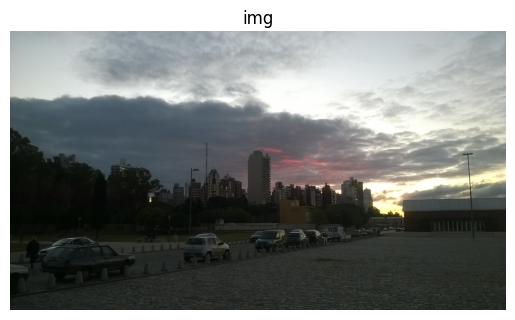

In [ ]:
img = cv2.imread("/content/Vision/EJ 8y9/WP_20160530_003.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.axis('off'), plt.title('img'), plt.imshow(img), plt.show();

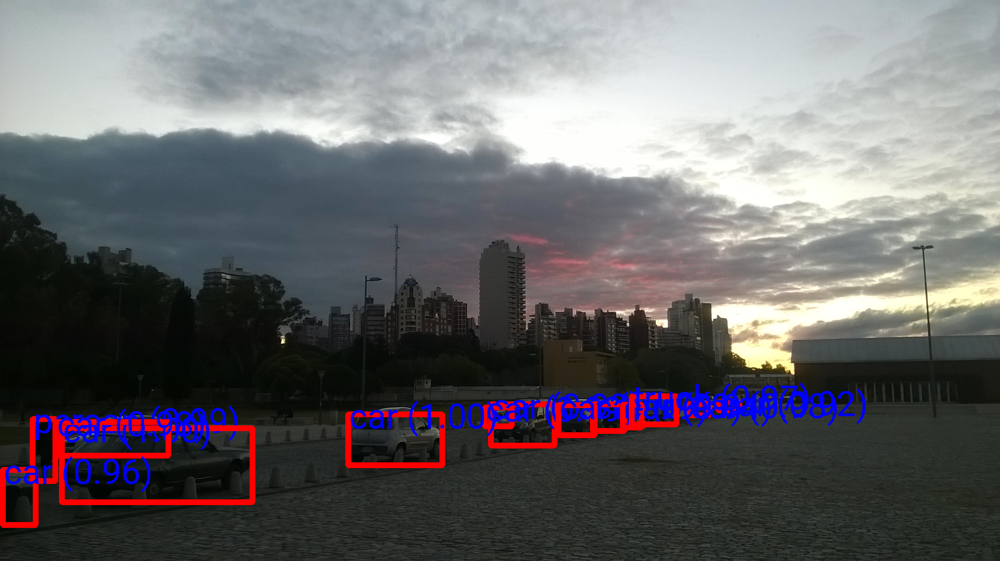

In [ ]:
# Detección
with Image.open("/content/Vision/EJ 8y9/WP_20160530_003.jpg") as im:

    # Realizar la detección de objetos
    bounding_boxes = object_detector(im)

    # Número de cajas
    num_boxes = len(bounding_boxes)

    # Dibujar cada cuadro delimitador
    for index, bounding_box in enumerate(bounding_boxes):
        box = bounding_box['box']
        im = draw_bounding_box(im, bounding_box['score'], bounding_box['label'],
                               int(box['xmin']), int(box['ymin']), int(box['xmax']),
                               int(box['ymax']), index, num_boxes)

    # Mostrar la imagen
    display(im)

**Conclusión:**

Se detectan los autos en la imagen, incluso aquél que esta por detras del primer auto.

**Clasificación de imágenes**

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from PIL import Image

In [ ]:
# Cargar el modelo preentrenado EfficientNetB0
model = EfficientNetB0(weights='imagenet')

def classify_image(img_path):
    # Cargar y preparar la imagen
    img = Image.open(img_path)
    img = img.resize((224, 224))  # Tamaño de entrada para EfficientNetB0

    # Convertir la imagen a un array y procesarla
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Realizar la predicción con el modelo
    predictions = model.predict(img_array)

    # Decodificar y retornar las predicciones
    return decode_predictions(predictions, top=3)[0]

21834768/21834768 [==============================] - 0s 0us/step


In [ ]:
# Imagen de Elvis, un gato.
img_1 = cv2.imread("/content/Vision/EJ 8y9/20200630_002843.jpg")
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
img_2 = cv2.imread("/content/Vision/EJ 8y9/20220707_185619.jpg")
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

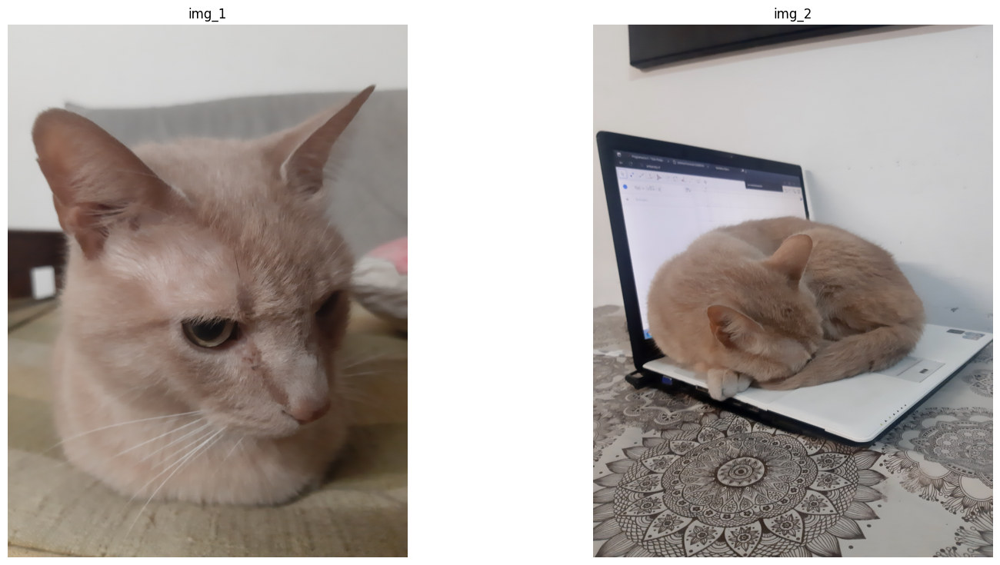

In [ ]:
plt.figure(figsize=(18,9))
plt.subplot(121)
plt.axis('off'), plt.title('img_1'), plt.imshow(img_1)
plt.subplot(122)
plt.axis('off'), plt.title('img_2'), plt.imshow(img_2)
plt.show()

In [ ]:
# Clasificar img_1
predictions = classify_image('/content/Vision/EJ 8y9/20200630_002843.jpg')

print('\n')

# Mostrar las predicciones
for i, (imagenet_id, label, score) in enumerate(predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

35363/35363 [==============================] - 0s 0us/step


1: hamster (0.28)
2: Persian_cat (0.14)
3: Siamese_cat (0.08)


In [ ]:
# Clasificar img_2
predictions = classify_image('/content/Vision/EJ 8y9/20220707_185619.jpg')

print('\n')

# Mostrar las predicciones
for i, (imagenet_id, label, score) in enumerate(predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 41ms/step


1: Pembroke (0.05)
2: hamster (0.04)
3: rubber_eraser (0.04)


**Conclusión:**

En la primer imagen clasifica como opciones menos probables algunas razas de gatos, en la segunda imagen no detecta ni siquiera al gato.

De todas maneras, en ninguno de los caso la primer opción clasificó al gato.